1. Carga de datos

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
import seaborn as sns
#sns.set()

In [3]:


dataset = pd.read_csv("./data/dry_bean_data.csv")
dataset.head()



,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [5]:
dataset['Class'].unique()
dataset.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


Muestra la relacion entre el número de registros y el los valores que hay entre ellos

In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

Eliminado de duplicados

In [7]:
dataset.drop_duplicates(inplace=True)

Resumen de valores NULL

In [8]:

dataset.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

<Axes: xlabel='count', ylabel='Class'>

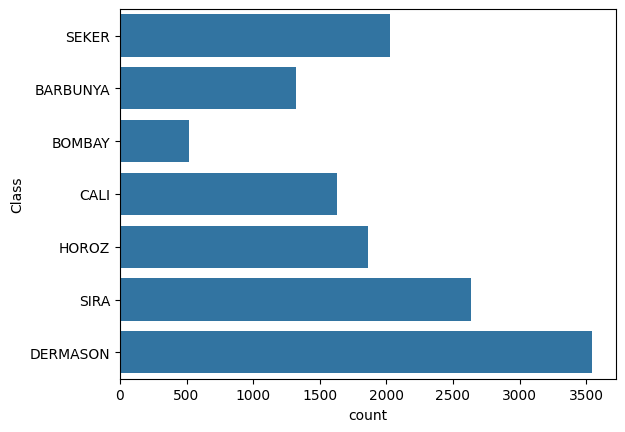

In [9]:
sns.countplot(dataset.Class)

Undersampling

In [12]:
from imblearn.under_sampling import RandomUnderSampler
undersampler = RandomUnderSampler(random_state=42)

In [13]:
x = dataset.drop ('Class', axis=1)
y = dataset.Class

In [14]:
x_overm, y_over = undersampler.fit_resample (x, y)

(array([  0., 100., 200., 300., 400., 500., 600.]),
 [Text(0.0, 0, '0'),
  Text(100.0, 0, '100'),
  Text(200.0, 0, '200'),
  Text(300.0, 0, '300'),
  Text(400.0, 0, '400'),
  Text(500.0, 0, '500'),
  Text(600.0, 0, '600')])

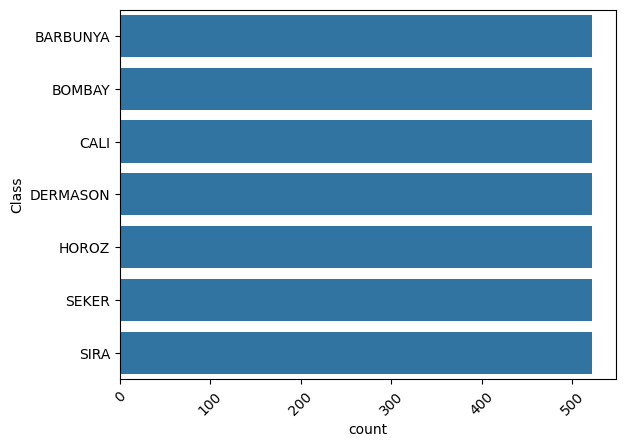

In [15]:
sns.countplot(y_over)
plt.xticks(rotation=45)

In [22]:
dataset = pd.DataFrame(dataset)
dataset.shape

(13543, 17)

In [23]:
x_overm.shape

(3654, 16)

Conversion a numericos

In [24]:
list(np.unique(y_over))

['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA']

In [25]:
y_over.replace(['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA'], [1,2,3,4,5,6,7], inplace=True)
list(np.unique(y_over))

/tmp/ipykernel_1266/2092354609.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  y_over.replace(['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA'], [1,2,3,4,5,6,7], inplace=True)


[1, 2, 3, 4, 5, 6, 7]

Analis de correlación

In [26]:
dataset_temporal = x_overm
dataset_temporal['Class'] = y_over


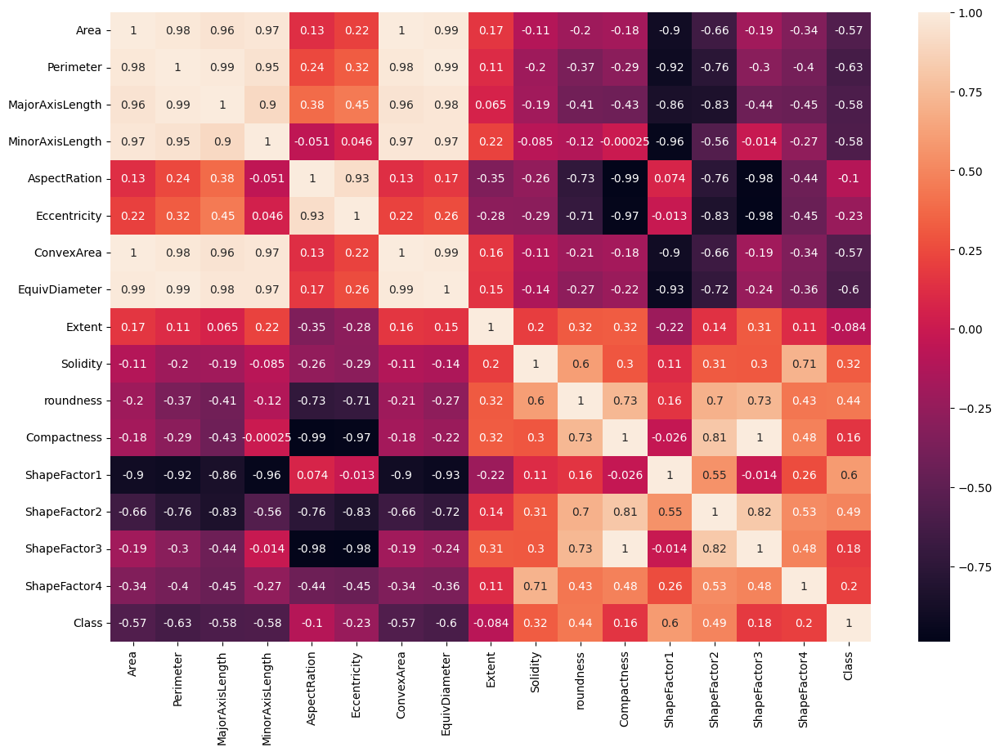

In [27]:
plt.figure(figsize=(15,10))
sns.heatmap(dataset_temporal.corr(),annot=True)
plt.show()

In [28]:
x_overm.drop(['ConvexArea', 'EquivDiameter'], axis=1, inplace=True)

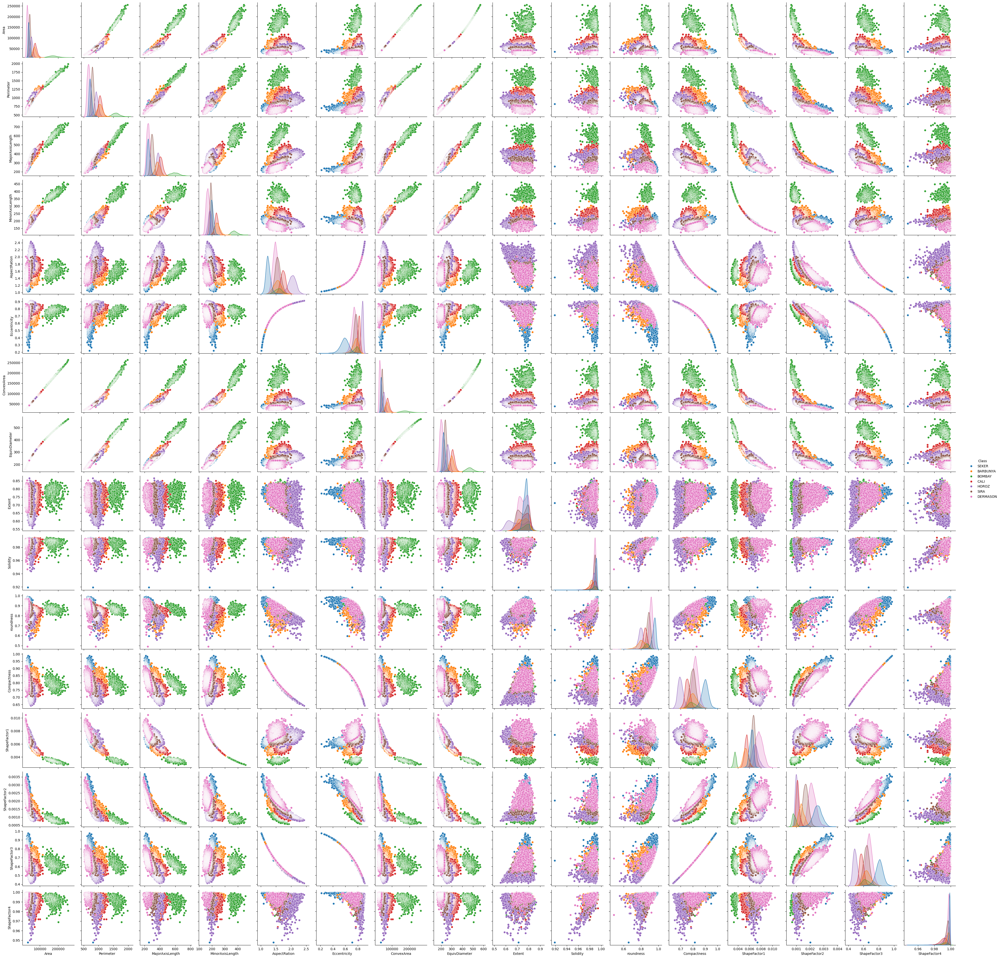

In [29]:
sns.pairplot(dataset, hue='Class')

Split y escalamiento de datos

In [30]:
X_train , X_test , y_train, y_test = train_test_split(x_overm, y_over, random_state=42, shuffle=True, test_size=.2)


In [ ]:
st_x = StandardScaler()
X_train = st_x.fit_transform(X_train)
X_test = st_x.transform(X_test)


3. Crear modelo de regresion lineal simple con el conjunto de entrenamiento 

In [31]:
def logistic_model (C_,solver_, multi_class_):
    clasificador = LogisticRegression(random_state=42, solver= solver_ , multi_class=multi_class_, n_jobs=-1, C=C_)
    return clasificador


In [32]:
model = logistic_model(1, 'saga', 'multinomial')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

/home/eyacelga/.virtualenvs/ai-proyecto-local/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


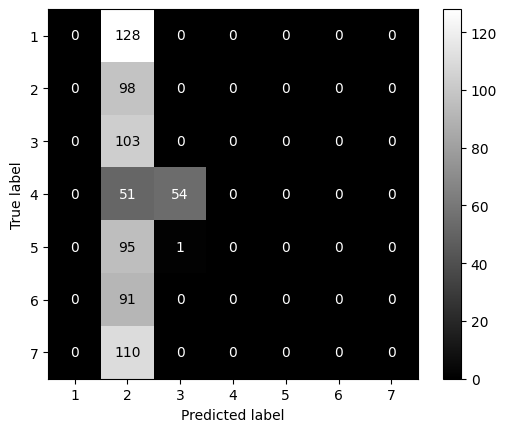

In [33]:


cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot(cmap='gray')
plt.show()

In [34]:
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test, y_pred))

[[  0 128   0   0   0   0   0]
 [  0  98   0   0   0   0   0]
 [  0 103   0   0   0   0   0]
 [  0  51  54   0   0   0   0]
 [  0  95   1   0   0   0   0]
 [  0  91   0   0   0   0   0]
 [  0 110   0   0   0   0   0]]
0.13406292749658003


In [35]:
multiclass = ['ovr', 'multinomial']
sover_list = ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
score = []
params=[]
for i in multiclass:
    for j in sover_list:
        try:
            model=logistic_model(1,j,i)
            model.fit(X_train, y_train)
            params.append(i+' - '+j)
            accuraci = accuracy_score(y_test, y_pred)
            score.append(accuraci )
        except:
            None            


/home/eyacelga/.virtualenvs/ai-proyecto-local/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1216: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 20.
  warnings.warn(
/home/eyacelga/.virtualenvs/ai-proyecto-local/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:313: LineSearchWarning: The line search algorithm did not converge
  alpha_star, phi_star, old_fval, derphi_star = scalar_search_wolfe2(
/home/eyacelga/.virtualenvs/ai-proyecto-local/lib/python3.11/site-packages/sklearn/utils/optimize.py:74: LineSearchWarning: The line search algorithm did not converge
  ret = line_search_wolfe2(
/home/eyacelga/.virtualenvs/ai-proyecto-local/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:313: LineSearchWarning: The line search algorithm did not converge
  alpha_star, phi_star, old_fval, derphi_star = scalar_search_wolfe2(
/home/eyacelga/.virtualenvs/ai-proyecto-local/lib/python3.11/site-packages/sklearn

In [ ]:
fig = plt.figure(figsize=(10,10))
sns.barplot(x= params, y=score).set_title('Beans Accuraci')
plt.xticks(rotation=90)
